<a href="https://colab.research.google.com/github/Cloud2602/Risk-Estimation-from-Multi-Sensor-Motion-Data/blob/main/Risk_estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Risk Estimation from Multi Sensor Motion Data

### Download Dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [41]:
# For v1.0 version of mini dataset
!wget https://man-truckscenes.s3.eu-central-1.amazonaws.com/release/mini/man-truckscenes_metadata_v1.0-mini.zip
!wget https://man-truckscenes.s3.eu-central-1.amazonaws.com/release/mini/man-truckscenes_sensordata_v1.0-mini.zip
!unzip "man-truckscenes_*.zip"

Streaming output truncated to the last 5000 lines.
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716774953983.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775005589.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775052244.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775103591.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775154645.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775202114.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775253343.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775351876.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775403897.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775455406.pcd  

In [2]:
%%bash
mkdir -p /content/data
cd "/content/drive/MyDrive"
unzip -o "man-truckscenes_*.zip" -d "/content"

Archive:  man-truckscenes_sensordata_v1.0-mini.zip
   creating: /content/man-truckscenes/
   creating: /content/man-truckscenes/samples/
   creating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473372666841.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473373166828.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473373666803.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473374166792.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473374667278.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473375166805.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473375666769.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BAC


2 archives were successfully processed.


Open github repository

In [ ]:
!git clone https://github.com/Cloud2602/Risk-Estimation-from-Multi-Sensor-Motion-Data.git

Cloning into 'Risk-Estimation-from-Multi-Sensor-Motion-Data'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (10/10), done.
Receiving objects: 100% (12/12), done.
Resolving deltas: 100% (2/2), done.
remote: Total 12 (delta 2), reused 0 (delta 0), pack-reused 0 (from 0)


## Initialization

In [3]:
!pip install truckscenes-devkit[all]

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.0/71.0 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 110.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 115.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.9/386.9 kB 33.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.5/133.5 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 86.9 MB/s eta 0:00:00
   ━━━

In [4]:
%matplotlib inline
from truckscenes import TruckScenes

trucksc = TruckScenes('v1.0-mini', 'man-truckscenes', True)

Loading truckscenes tables for version v1.0-mini...
11 attribute,
18 calibrated_sensor,
27 category,
20090 ego_motion_cabin,
20089 ego_motion_chassis,
20116 ego_pose,
1094 instance,
400 sample,
25750 sample_annotation,
43556 sample_data,
10 scene,
18 sensor,
4 visibility,
Done loading in 1.281 seconds.
Reverse indexing ...
Done reverse indexing in 0.2 seconds.


BEV

In [14]:
!mkdir /content/man-truckscenes/samples/BEV


In [42]:
import json

file_path = "/content/man-truckscenes/v1.0-mini/sample_data.json"

try:
    with open(file_path, 'r') as f:
        data = json.load(f)
    print("✅ JSON caricato correttamente.")
except json.JSONDecodeError as e:
    print("❌ Errore nel parsing del file JSON:")
    print(f"  Messaggio: {e.msg}")
    print(f"  Riga: {e.lineno}, Colonna: {e.colno}")
    print(f"  Posizione: {e.pos}")

    # Stampa la riga problematica
    with open(file_path, 'r') as f:
        lines = f.readlines()
        if e.lineno <= len(lines):
            print("\n🔍 Riga con l'errore:")
            print(lines[e.lineno - 1].rstrip())
        else:
            print("⚠️ Impossibile accedere alla riga dell'errore: fuori intervallo.")
except FileNotFoundError:
    print("❌ File non trovato.")
except Exception as e:
    print(f"❌ Altro errore: {e}")


✅ JSON caricato correttamente.


LIDAR_LEFT: 80729 punti
LIDAR_RIGHT: 81221 punti
LIDAR_TOP_FRONT: 17458 punti
LIDAR_TOP_LEFT: 23344 punti
LIDAR_TOP_RIGHT: 22034 punti
LIDAR_REAR: 17262 punti
Totale punti uniti nel frame 0: 242048


<ipython-input-47-795850be67a6>:35: RuntimeWarning: invalid value encountered in divide
  intensities_scaled = ((intensities - np.min(intensities)) /
<ipython-input-47-795850be67a6>:36: RuntimeWarning: invalid value encountered in cast
  np.ptp(intensities) * 255).astype(np.uint8)
<ipython-input-47-795850be67a6>:46: RuntimeWarning: overflow encountered in scalar add
  R[xi, yi] += 1


AttributeError: 'NoneType' object has no attribute 'savefig'

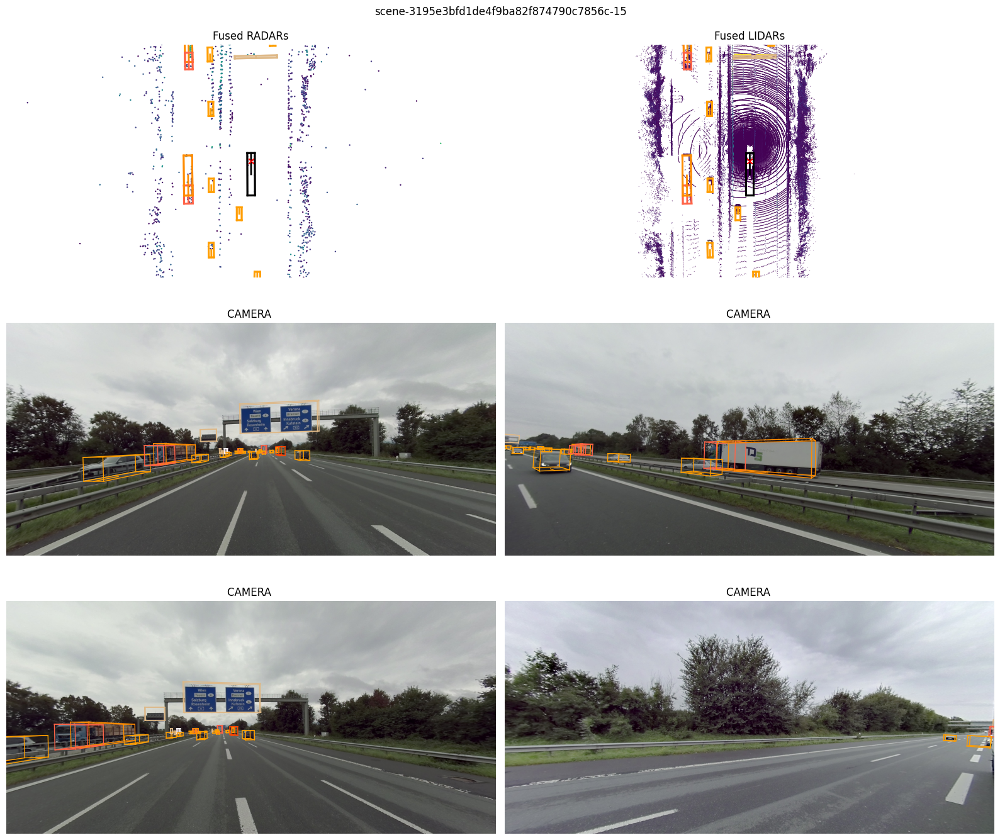

In [47]:
from scipy.spatial.transform import Rotation as R
import numpy as np
import json
import open3d as o3d
import glob
import os
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from truckscenes import TruckScenes  # Assicurati di aver installato il devkit

def bev_rgb_enhanced(points, intensities=None,
                     res=0.1,
                     side_range=(-25, 25), fwd_range=(0, 50),
                     height_range=(-2, 2), ground_threshold=-1.5):

    x, y, z = points[:, 0], points[:, 1], points[:, 2]
    if intensities is None:
        intensities = np.ones_like(x)

    mask = (
        (x > fwd_range[0]) & (x < fwd_range[1]) &
        (y > side_range[0]) & (y < side_range[1]) &
        (z > ground_threshold)
    )
    x, y, z, intensities = x[mask], y[mask], z[mask], intensities[mask]

    x_img = ((x - fwd_range[0]) / res).astype(np.int32)
    y_img = ((y - side_range[0]) / res).astype(np.int32)
    H = int((fwd_range[1] - fwd_range[0]) / res)
    W = int((side_range[1] - side_range[0]) / res)

    z_scaled = ((np.clip(z, *height_range) - height_range[0]) /
                (height_range[1] - height_range[0]) * 255).astype(np.uint8)
    intensities_scaled = ((intensities - np.min(intensities)) /
                          np.ptp(intensities) * 255).astype(np.uint8)

    R = np.zeros((H, W), dtype=np.uint8)
    G = np.zeros((H, W), dtype=np.uint8)
    B = np.zeros((H, W), dtype=np.uint8)
    count = np.zeros((H, W), dtype=np.uint16)

    for xi, yi, zi, ii in zip(x_img, y_img, z_scaled, intensities_scaled):
        G[xi, yi] = max(G[xi, yi], zi)
        B[xi, yi] = max(B[xi, yi], ii)
        R[xi, yi] += 1
        count[xi, yi] += 1

    R = np.clip((R / R.max()) * 255, 0, 255).astype(np.uint8)

    R_eq = cv2.equalizeHist(R)
    G_eq = cv2.equalizeHist(G)
    B_eq = cv2.equalizeHist(B)

    bev = np.stack([R_eq, G_eq, B_eq], axis=-1)
   # bev = np.array(Image.fromarray(bev).resize((512, 512)))

    return bev


def build_transformation_matrix(rotation_quat, translation):
    r = R.from_quat([rotation_quat[1], rotation_quat[2], rotation_quat[3], rotation_quat[0]])
    rot_matrix = r.as_matrix()
    trans_matrix = np.eye(4)
    trans_matrix[:3, :3] = rot_matrix
    trans_matrix[:3, 3] = translation
    return trans_matrix

def transform_pointcloud(points, transform):
    points_h = np.hstack((points, np.ones((points.shape[0], 1))))
    transformed = (transform @ points_h.T).T
    return transformed[:, :3]

# === Inizializzazione dataset ===
sensor_map = {
    "1c4f2bbb64f847a193c748c1c14f0574": "LIDAR_LEFT",
    "fe19aa64da874708a8cd417103e7cdc7": "LIDAR_RIGHT",
    "3f53edcde9e44caaba5e689726c7aab7": "LIDAR_TOP_FRONT",
    "9ecd75e3eaf643d5b1d5a6cefba7f1f3": "LIDAR_TOP_LEFT",
    "fcddf720b15b4bc3b59eef0bdf3e0f94": "LIDAR_TOP_RIGHT",
    "40dad62928a4498699eebf9aa7f4be98": "LIDAR_REAR",
}

with open("man-truckscenes/v1.0-mini/calibrated_sensor.json", "r") as f:
    calibration_data = json.load(f)

sensor_transforms = {}
for entry in calibration_data:
    token = entry["sensor_token"]
    if token in sensor_map:
        T = build_transformation_matrix(entry["rotation"], entry["translation"])
        sensor_transforms[sensor_map[token]] = T

# === Carica devkit e sample_data.json ===
with open("man-truckscenes/v1.0-mini/sample_data.json") as f:
    sample_data = json.load(f)

# === File LiDAR ===
base_dir = "/content/man-truckscenes/samples"
sensor_dirs = list(sensor_transforms.keys())

sensor_files = {}
for sensor in sensor_dirs:
    files = sorted(glob.glob(os.path.join(base_dir, sensor, "*.pcd")))
    sensor_files[sensor] = files

num_frames = min(len(files) for files in sensor_files.values())

# === Ciclo principale ===
for i in range(num_frames):
    all_points = []

    for sensor in sensor_dirs:
        file_path = sensor_files[sensor][i]
        pcd = o3d.io.read_point_cloud(file_path)
        points = np.asarray(pcd.points)
        T = sensor_transforms[sensor]
        points_transformed = transform_pointcloud(points, T)
        all_points.append(points_transformed)
        print(f"{sensor}: {points_transformed.shape[0]} punti")

    merged_points = np.vstack(all_points)
    print(f"Totale punti uniti nel frame {i}: {merged_points.shape[0]}")

    # === 1. Salva immagine BEV personalizzata ===
    bev_image = bev_rgb_enhanced(merged_points)
    Image.fromarray(bev_image).save(f"/content/bev_frame_{i:05d}.png")

    # === 2. Trova sample_token usando LIDAR_LEFT ===
    reference_filename = os.path.basename(sensor_files["LIDAR_TOP_FRONT"][i])
    sample_token = None
    for entry in sample_data:
        if reference_filename in entry["filename"]:
            sample_token = entry["sample_token"]
            break

    # === 3. Render devkit image con bounding box ===
    if sample_token:
        fig = trucksc.render_sample(sample_token)
        fig.savefig(f"/content/render_sample_{i:05d}.png")
        plt.close(fig)


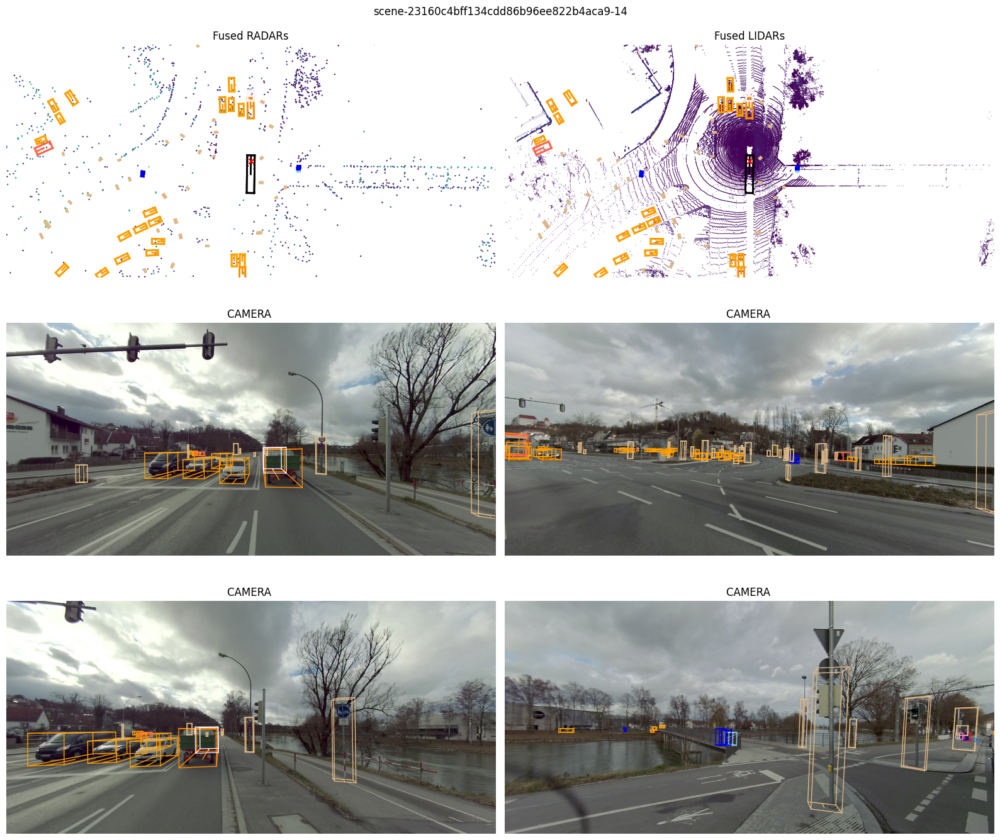

In [23]:
my_sample = trucksc.sample[100]
trucksc.render_sample(my_sample['token'])